### Домашняя работа 4 по компьютерному зрению

Выполнил Партин Максим
Проверил Копылов Иван

### Часть 1 обучение генеративной модели GAN

In [26]:
import os
import numpy as np
import torch
import torch.nn as nn
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import matplotlib.pyplot as plt

from torchvision.utils import make_grid
from tqdm import tqdm

Для обучения GAN модели воспользуемся датасетом CIFAR10

In [34]:
device = "cuda" if torch.cuda.is_available() else "cpu"
transform = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize(
            (0.4914, 0.4822, 0.4465),
             (0.2023, 0.1994, 0.2010)
        )
    ]
)

dataset = datasets.CIFAR10(root="data", download=True, transform=transform)
data_loader = torch.utils.data.DataLoader(dataset, batch_size=64, shuffle=True)
batch = next(iter(data_loader))

def show(imgs):
    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = F.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])


Посмотрим на изображения в датасете

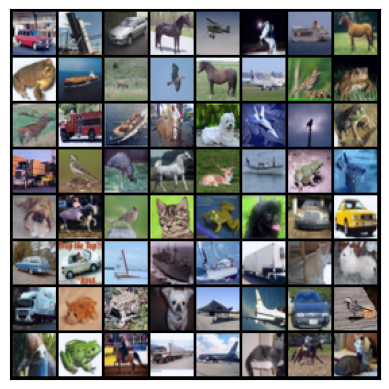

In [36]:
show(make_grid(batch[0], normalize=True))

Для начала обучим оригинальный GAN на датасете, так называемый VanilaGAN. Код для обучения был взят из данного репозитория https://github.com/safwankdb/Vanilla-GAN

In [41]:
class Generator(nn.Module):
    def __init__(self, latent_dim: int):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 32 * 32),
            nn.Tanh()  # Приводим к [-1, 1]
        )

    def forward(self, z):
        return self.model(z)

# Дискриминатор (FC)
class Discriminator(nn.Module):
    def __init__(self, img_size):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(img_size, 512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Linear(256, 1),
            nn.Sigmoid()  # Вероятность "реальности"
        )

    def forward(self, img):
        return self.model(img)


In [42]:
lr = 0.0002
batch_size = 64
image_size = 32 * 32  # размер изображений в датасете
latent_dim = 200 # рамер скрытого вектора (z)
epochs = 50 # Количество эпох обучения

In [43]:
# Инициализация моделей
generator = Generator(latent_dim).to(device)
discriminator = Discriminator(image_size).to(device)

# Оптимизаторы
opt_gen = torch.optim.Adam(generator.parameters(), lr=lr)
opt_disc = torch.optim.Adam(discriminator.parameters(), lr=lr)

# Функция потерь
criterion = nn.BCELoss()

In [44]:
imgs_real_grid = []
imgs_fake_grid = []
for epoch in range(epochs):
    for batch_idx, (real, _) in enumerate(data_loader):
        real = real.view(-1, image_size).to(device)
        batch_size = real.shape[0]

        # ---- Обучаем Дискриминатор (max log(D(x)) + log(1 - D(G(z)))) ----
        noise = torch.randn(batch_size, latent_dim).to(device)
        fake = generator(noise)

        # Лосс для реальных и фейковых изображений
        disc_real = discriminator(real).view(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))

        disc_fake = discriminator(fake.detach()).view(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))

        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        discriminator.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        # ---- Обучаем Генератор (min log(1 - D(G(z))) → max log(D(G(z))) ----
        output = discriminator(fake).view(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        generator.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        if batch_idx == 0:
          print(
                f"Epoch [{epoch}/{epochs}] \ "
                f"Loss D: {loss_disc:.4f}, Loss G: {loss_gen:.4f}"
            )

          with torch.no_grad():
                fake = generator(noise).reshape(-1, 3, 32, 32)
                real = real.reshape(-1, 3, 32, 32)

                img_grid_fake = make_grid(fake, normalize=True)
                img_grid_real = make_grid(real, normalize=True)
          imgs_real_grid.append(img_grid_real)
          imgs_fake_grid.append(img_grid_fake)

Epoch [0/50] \ Loss D: 0.7223, Loss G: 0.6830
Epoch [1/50] \ Loss D: 0.0511, Loss G: 4.2422
Epoch [2/50] \ Loss D: 0.0987, Loss G: 4.4710
Epoch [3/50] \ Loss D: 0.1919, Loss G: 3.7140
Epoch [4/50] \ Loss D: 0.3346, Loss G: 3.7158
Epoch [5/50] \ Loss D: 0.2003, Loss G: 3.4315
Epoch [6/50] \ Loss D: 0.0775, Loss G: 3.2022
Epoch [7/50] \ Loss D: 0.0746, Loss G: 4.9426
Epoch [8/50] \ Loss D: 0.1202, Loss G: 3.4228
Epoch [9/50] \ Loss D: 0.1004, Loss G: 3.5577
Epoch [10/50] \ Loss D: 0.1317, Loss G: 4.0049
Epoch [11/50] \ Loss D: 0.1332, Loss G: 3.9367
Epoch [12/50] \ Loss D: 0.0884, Loss G: 3.9615
Epoch [13/50] \ Loss D: 0.1003, Loss G: 4.2302
Epoch [14/50] \ Loss D: 0.0610, Loss G: 6.5149
Epoch [15/50] \ Loss D: 0.0834, Loss G: 4.1439
Epoch [16/50] \ Loss D: 0.0866, Loss G: 3.8400
Epoch [17/50] \ Loss D: 0.0524, Loss G: 5.2675
Epoch [18/50] \ Loss D: 0.0593, Loss G: 5.4076
Epoch [19/50] \ Loss D: 0.0658, Loss G: 4.7941
Epoch [20/50] \ Loss D: 0.2096, Loss G: 4.6691
Epoch [21/50] \ Loss D:

In [52]:
import matplotlib.animation as animation

experiment_name = "vanila_gan"

def save_animations_gan_train(imgs_fake_grid: torch.tensor, experiment_name: str):
  fig, ax = plt.subplots()
  img = ax.imshow(imgs_fake_grid[0].cpu().numpy().transpose(1, 2, 0),)
  ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
  # Animation update function
  def update(frame):
      plt.title(f"Epoch: {frame}")
      img.set_data(imgs_fake_grid[frame].cpu().numpy().transpose(1, 2, 0))
      ax.set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
      return img,

  ani = animation.FuncAnimation(fig, update, frames=len(imgs_fake_grid), blit=True)
  video_writer = animation.FFMpegWriter(extra_args=["-vcodec", "libx264"], fps=5)
  ani.save(f"{experiment_name}.mp4", writer=video_writer)

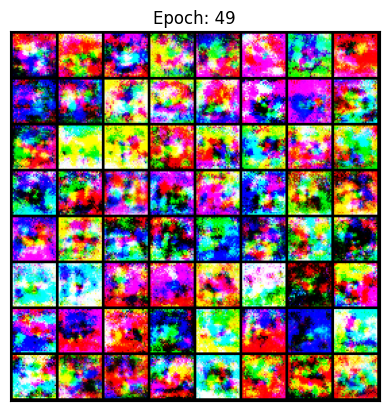

In [53]:
save_animations_gan_train(imgs_fake_grid, experiment_name)

In [54]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open(f"{experiment_name}.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

**Вывод:** Результаты VanilaGAN получились крайне плохими. Попробуем более сложные архитектуры для решения данной проблемы

**Обучение DCGAN**

В качестве источника вдохновения был использован tutorial с сайта pytorch https://docs.pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

In [64]:
epochs = 100
latent_dim = 100
batch_size = 128
epochs = 200
learning_rate = 0.0002
beta1 = 0.5
img_channels = 3
img_size = 32

class Generator(nn.Module):
    def __init__(self, latent_dim):
        super(Generator, self).__init__()
        
        self.init_size = img_size // 4
        self.l1 = nn.Sequential(nn.Linear(latent_dim, 128 * self.init_size**2))
        
        self.conv_blocks = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 128, 3, stride=1, padding=1),
            nn.BatchNorm2d(128, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, stride=1, padding=1),
            nn.BatchNorm2d(64, 0.8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, img_channels, 3, stride=1, padding=1),
            nn.Tanh()
        )
    
    def forward(self, z):
        out = self.l1(z)
        out = out.view(out.shape[0], 128, self.init_size, self.init_size)
        img = self.conv_blocks(out)
        return img

# Discriminator network
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        def discriminator_block(in_filters, out_filters, bn=True):
            block = [nn.Conv2d(in_filters, out_filters, 3, 2, 1)]
            if bn:
                block.append(nn.BatchNorm2d(out_filters, 0.8))
            block.extend([
                nn.LeakyReLU(0.2, inplace=True),
                nn.Dropout2d(0.25)
            ])
            return block
        
        self.model = nn.Sequential(
            *discriminator_block(img_channels, 16, bn=False),
            *discriminator_block(16, 32),
            *discriminator_block(32, 64),
            *discriminator_block(64, 128),
        )
        
        # The height and width of downsampled image
        ds_size = img_size // 2**4
        self.adv_layer = nn.Sequential(
            nn.Linear(128 * ds_size**2, 1),
            nn.Sigmoid()
        )
    
    def forward(self, img):
        out = self.model(img)
        out = out.view(out.shape[0], -1)
        validity = self.adv_layer(out)
        return validity

# Initialize generator and discriminator
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)

# Optimizers
optimizer_G = torch.optim.Adam(
    generator.parameters(), lr=learning_rate, betas=(beta1, 0.999)
)
optimizer_D = torch.optim.Adam(
    discriminator.parameters(), lr=learning_rate, betas=(beta1, 0.999)
)

# Loss function
adversarial_loss = nn.BCELoss()

imgs_real_grid, imgs_fake_grid = [], []
for epoch in range(epochs):
    for batch_idx, (imgs, _) in enumerate(data_loader):
        
        # Adversarial ground truths
        valid = torch.ones(imgs.size(0), 1).to(device)
        fake = torch.zeros(imgs.size(0), 1).to(device)
        
        # Configure input
        real_imgs = imgs.to(device)
        
        # -----------------
        #  Train Generator
        # -----------------
        optimizer_G.zero_grad()
        
        # Sample noise as generator input
        z = torch.randn(imgs.size(0), latent_dim).to(device)
        
        # Generate a batch of images
        gen_imgs = generator(z)
        
        # Loss measures generator's ability to fool the discriminator
        g_loss = adversarial_loss(discriminator(gen_imgs), valid)
        
        g_loss.backward()
        optimizer_G.step()
        
        # ---------------------
        #  Train Discriminator
        # ---------------------
        optimizer_D.zero_grad()
        
        # Measure discriminator's ability to classify real from generated samples
        real_loss = adversarial_loss(discriminator(real_imgs), valid)
        fake_loss = adversarial_loss(discriminator(gen_imgs.detach()), fake)
        d_loss = (real_loss + fake_loss) / 2
        
        d_loss.backward()
        optimizer_D.step()
        
        if batch_idx == 0:
          print(
                f"Epoch [{epoch}/{epochs}] \ "
                f"Loss D: {d_loss:.4f}, Loss G: {g_loss:.4f}"
            )

          with torch.no_grad():
                z = torch.randn(16, latent_dim).to(device)
                gen_imgs = generator(z)
                gen_imgs = gen_imgs
                grid = make_grid(gen_imgs, nrow=4, normalize=True)
          imgs_fake_grid.append(grid)    

Epoch [0/200] \ Loss D: 0.6928, Loss G: 0.6930
Epoch [1/200] \ Loss D: 0.0134, Loss G: 3.7635
Epoch [2/200] \ Loss D: 0.0037, Loss G: 6.1864
Epoch [3/200] \ Loss D: 0.0020, Loss G: 7.6142
Epoch [4/200] \ Loss D: 0.0004, Loss G: 8.2614
Epoch [5/200] \ Loss D: 0.0002, Loss G: 7.8946
Epoch [6/200] \ Loss D: 0.0008, Loss G: 7.6033
Epoch [7/200] \ Loss D: 0.0001, Loss G: 9.0242
Epoch [8/200] \ Loss D: 0.0001, Loss G: 9.2927
Epoch [9/200] \ Loss D: 0.0001, Loss G: 10.3526
Epoch [10/200] \ Loss D: 0.0000, Loss G: 10.0966
Epoch [11/200] \ Loss D: 0.0001, Loss G: 10.7742
Epoch [12/200] \ Loss D: 0.0000, Loss G: 13.4277
Epoch [13/200] \ Loss D: 0.0000, Loss G: 12.4070
Epoch [14/200] \ Loss D: 0.0000, Loss G: 13.0851
Epoch [15/200] \ Loss D: 0.0000, Loss G: 13.4091
Epoch [16/200] \ Loss D: 0.0000, Loss G: 14.6085
Epoch [17/200] \ Loss D: 0.0000, Loss G: 13.2306
Epoch [18/200] \ Loss D: 0.0000, Loss G: 14.3206
Epoch [19/200] \ Loss D: 0.0000, Loss G: 14.8065
Epoch [20/200] \ Loss D: 2.9506, Loss G

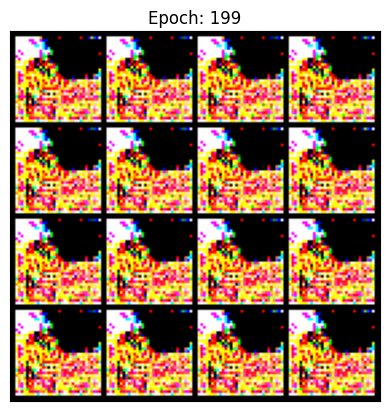

In [65]:
experiment_name = "dcgan"
save_animations_gan_train(imgs_fake_grid, experiment_name)

In [66]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open(f"{experiment_name}.mp4", "rb").read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

**Вывод:** Были применены достаточные старые GAN модели и они не смогли обучиться на датасете CIFAR10 для генерации изображений

### Часть 2 Применение VIT архитектур в задаче классификации изображений

In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import torchvision.models as models
import matplotlib.pyplot as plt

from torchvision.utils import make_grid
from tqdm import tqdm
from PIL import Image

В рамках задачи был взят датасет изображений с сайта kaggle https://www.kaggle.com/datasets/puneet6060/intel-image-classification
по классификации того, что изображено на картинке. Всего в датасете 6 классов: здание, лес, ледник, гора, море, улица. Распакуем датасет 

In [2]:
!unzip -q -o intel_images.zip -d intel_images 

Посмотрим на изображения с датасета. Напишем кастомный класс датасета для загрузки изображений

In [3]:
label_to_idx = {
    "buildings": 0,
    "forest": 1,
    "glacier": 2,
    "mountain": 3,
    "sea": 4,
    "street": 5,
}

idx_to_label = {idx: label for label, idx in label_to_idx.items()}

# Класс для загрузки датасета изображений
class IntelImagesDataset(torch.utils.data.Dataset):
    def __init__(self, path_to_dataset: str, label_to_idx: dict[str, int], transform = None):
        self.images = []
        self.labels = []
        self.label_to_idx = label_to_idx
        self.transform = transform

        count_images = 0
        for label in os.listdir(path_to_dataset):
            path_to_label_images = os.path.join(path_to_dataset, label)
            for image in os.listdir(path_to_label_images):
                count_images += 1
                path_to_image = os.path.join(path_to_label_images, image)
                self.images.append(path_to_image)
                self.labels.append(label)

    def __len__(self) -> int:
        return len(self.images)


    def __getitem__(self, index: int) -> tuple[torch.tensor, torch.tensor]:
        image = Image.open(self.images[index])
        label = self.label_to_idx[self.labels[index]]

        if self.transform:
            image = self.transform(image)

        label = torch.tensor(label, dtype=torch.long)

        return image, label

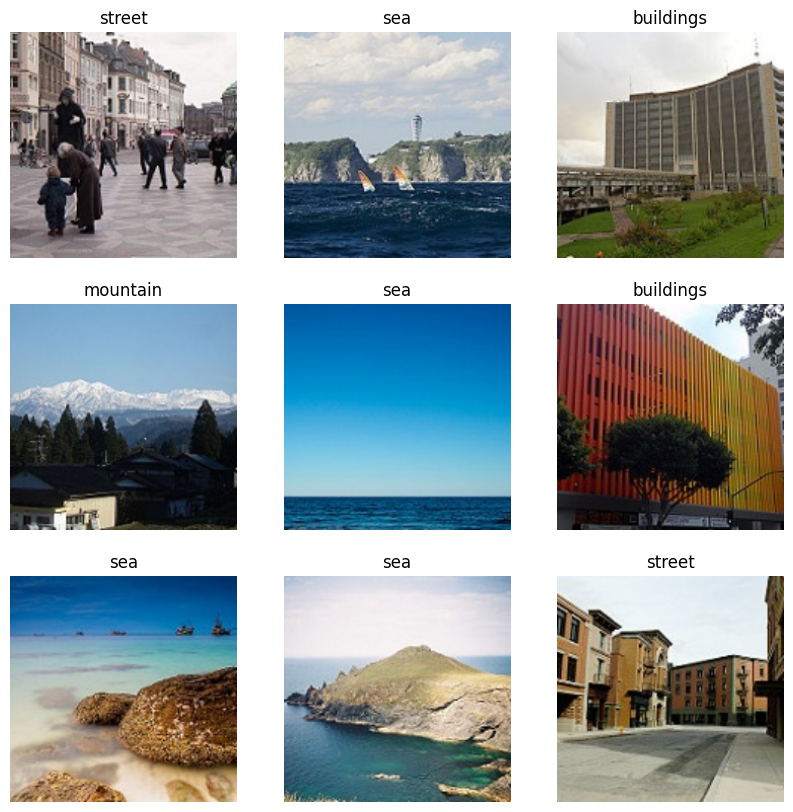

In [4]:
path_to_train_dataset = "intel_images/seg_train/seg_train"
path_to_test_dataset = "intel_images/seg_test/seg_test"

transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ]
)

train_dataset = IntelImagesDataset(path_to_train_dataset, label_to_idx, transform)
test_dataset = IntelImagesDataset(path_to_test_dataset, label_to_idx, transform)

random_indexes = np.random.choice(np.arange(len(train_dataset)), size=9, replace=False)
_, axes = plt.subplots(3, 3, figsize=(10, 10))
random_indexes = random_indexes.reshape((3, 3))
for i in range(3):
  for j in range(3):
    image_index = random_indexes[i][j]
    axes[i][j].imshow(train_dataset[image_index][0].permute(1, 2, 0).numpy())
    class_name = idx_to_label[int(train_dataset[image_index][1].item())]
    axes[i][j].set_title(class_name)
    axes[i][j].axis("off")
plt.axis("off")
plt.show()

Посчитаем значение среднего и дисперсии для трениовочной части изображений на датасете, чтобы потом произвести нормализацию изображений

In [6]:
train_dataloader = torch.utils.data.DataLoader(train_dataset, shuffle=False, batch_size=64) # В данном случае не нужно шафлить, так как еще не обучаем сеть

mean = torch.Tensor([0.0, 0.0, 0.0])
std = torch.Tensor([0.0, 0.0, 0.0])
for images, _ in train_dataloader:
  batch_size = images.size(0)
  images = images.view(batch_size, images.size(1), -1)
  mean += images.mean(2).sum(0)
  std += images.std(2).sum(0)

mean = mean / len(train_dataloader.dataset)
std = std / len(train_dataloader.dataset)
mean, std = mean.cpu().numpy(), std.cpu().numpy()
print(f"mean: {mean}, std: {std}")

mean: [0.43019864 0.45750076 0.4538696 ], std: [0.22464256 0.22371267 0.23262827]


Теперь можем перейти к обучению сети. Для сравнения работы VIT архитектуры и сверточных нейронных сетей. Проведем 2 эксперимента:

- Обучение сети ResNet50
- Обучение сети Vit

Каждую сеть обучим одинаковое количество эпох и сравним 

Напишем функцию для обучения сети

In [7]:
# Функция на вход принимает модель, функцию потерь, оптимизатор, ко
def train_model(model: nn.Module, criterion: nn.Module, optimizer: torch.optim.Optimizer, num_epochs: int, train_dataset: torch.utils.data.Dataset,
               batch_size: int, experiment_name: str, device: str) -> tuple[nn.Module, list[float]]:
  train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
  train_epoch_losses = []
  for epoch in tqdm(range(num_epochs), desc="Epoch"):

    # Цикл обучения по обучающей выборке из датасета
    model.train()
    running_loss = 0.0
    for inputs, labels in train_loader:
      inputs = inputs.to(device)
      labels = labels.to(device)

      optimizer.zero_grad()

      outputs = model(inputs)
      loss = criterion(outputs, labels)

      loss.backward()
      optimizer.step()

      running_loss += loss.item() * inputs.size(0)

    epoch_loss = running_loss / len(train_dataset)
    train_epoch_losses.append(epoch_loss)

    print(f"Train loss: {epoch_loss:.4f}")
  return model, train_epoch_losses

**Эксперимент 1 обучение сети resnet50**

In [8]:
train_transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomRotation(30), # Случайно поворачиваем изображение на +- 30 градусов во время обучения
        transforms.RandomGrayscale(p=0.1), # Случайно переводим изображение в оттенки серого с вероятностью 0.1 во время обучения
        transforms.ColorJitter( # Случайно изменяем цветовую палитру изображения во время обучения
          brightness=0.2,
          contrast=0.2,
          saturation=0.2,
          hue=0.1
        ),
        transforms.GaussianBlur(kernel_size=3), # Применяем гауссовские размытие к изображению
        transforms.ToTensor(), # Переводим изображение в torch.tensor
        transforms.Normalize( # Нормализуем изображение
          tuple(mean),
          tuple(std),
        ),
    ]
)

train_dataset = IntelImagesDataset(path_to_train_dataset, label_to_idx, train_transform)
model = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
# Замораживаем все слои
for param in model.parameters():
    param.requires_grad = False

model.fc = nn.Linear(2048, len(label_to_idx))

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())
batch_size = 4096
device = "cuda" if torch.cuda.is_available() else "cpu"
num_epochs = 10
experiment_name = "resnet50 модель"
model = model.to(device)
model, train_losses = train_model(
    model=model,
    criterion=criterion,
    optimizer=optimizer, 
    num_epochs=num_epochs, 
    train_dataset=train_dataset, 
    batch_size=batch_size, 
    experiment_name=experiment_name, 
    device=device,
)

Epoch:  10%|█         | 1/10 [22:01<3:18:14, 1321.61s/it]

Train loss: 1.7157


Epoch:  20%|██        | 2/10 [44:18<2:57:26, 1330.75s/it]

Train loss: 1.4468


Epoch:  30%|███       | 3/10 [51:52<1:48:33, 930.47s/it] 

Train loss: 1.2320


Epoch:  40%|████      | 4/10 [53:47<1:00:49, 608.29s/it]

Train loss: 1.0623


Epoch:  50%|█████     | 5/10 [55:40<35:49, 429.85s/it]  

Train loss: 0.9360


Epoch:  60%|██████    | 6/10 [57:35<21:31, 322.78s/it]

Train loss: 0.8360


Epoch:  70%|███████   | 7/10 [59:31<12:44, 254.99s/it]

Train loss: 0.7617


Epoch:  80%|████████  | 8/10 [1:01:25<07:00, 210.27s/it]

Train loss: 0.7022


Epoch:  90%|█████████ | 9/10 [1:03:22<03:01, 181.05s/it]

Train loss: 0.6552


Epoch: 100%|██████████| 10/10 [1:05:20<00:00, 392.01s/it]

Train loss: 0.6195


Посмотрим на график функции потерь

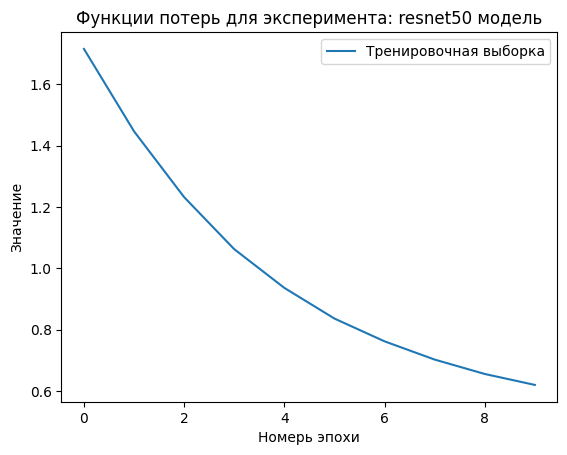

In [10]:
plt.plot(np.arange(len(train_losses)), train_losses, label="Тренировочная выборка")
plt.title(f"Функции потерь для эксперимента: {experiment_name}")
plt.xlabel("Номерь эпохи")
plt.ylabel("Значение")
plt.legend()
plt.show()

Посчитаем метрики для модели

In [11]:
import torch.nn.functional as F
from sklearn.metrics import f1_score, precision_score, recall_score

# Функция для получения предсказаний модели
def make_predictions(model: nn.Module, data_loader: torch.utils.data.DataLoader, device: str) -> tuple[np.ndarray, np.ndarray]:
  model.eval()
  predicted_labels = []
  predicted_label_probas = []
  for images, _ in data_loader:
    images = images.to(device)
    with torch.no_grad():
      outputs = model(images)
      predicted_labels.extend(F.softmax(outputs, dim=-1).argmax(axis=1).cpu().numpy())
      predicted_label_probas.extend(F.softmax(outputs, dim=-1).max(axis=1).values.cpu().numpy())

  return np.array(predicted_labels), np.array(predicted_label_probas)

# Функция для расчета метрик качества модели
def compute_metrics(model: nn.Module, data_loader: torch.utils.data.Dataset, experiment_name: str, print_metrics: bool = False) -> dict:
  predicted_labels, _ = make_predictions(model, data_loader, device)
  true_labels = []
  for _, labels in data_loader:
    true_labels.extend(labels.cpu().numpy())
  true_labels = np.array(true_labels)
  metrics = {
      "f1": f1_score(true_labels, predicted_labels, average="macro"),
      "recall": recall_score(true_labels, predicted_labels, average="macro"),
      "precision": precision_score(true_labels, predicted_labels, average="macro"),
  }
  if print_metrics:
    print(f"Experiment name: {experiment_name}")
    print(f"model_metrics: {metrics}")
  return metrics

In [16]:
transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize( # Нормализуем изображение
              tuple(mean),
              tuple(std),
        ),
    ]
)
train_dataset = IntelImagesDataset(path_to_train_dataset, label_to_idx, transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
metrics = compute_metrics(model, test_loader, experiment_name, print_metrics=True)

Experiment name: resnet50 модель
model_metrics: {'f1': 0.8326253809183131, 'recall': 0.8375660346792979, 'precision': 0.8354329546688682}


In [17]:
def visualize_model_predictions(model: nn.Module, test_dataset: torch.utils.data.Dataset,
                                test_loader: torch.utils.data.Dataset, experiment_name: str,
                                device: str, idx_to_label: dict[int, str], mean: np.ndarray | None = None, std: np.ndarray | None = None):
  predicted_labels, predicted_probas = make_predictions(model, test_loader, device)
  true_labels = []
  for _, labels in test_loader:
    true_labels.extend(labels.cpu().numpy())
  true_labels = np.array(true_labels)
  random_indexes = np.random.choice(np.arange(len(test_dataset)), size=9, replace=False)
  _, axes = plt.subplots(3, 3, figsize=(15, 15))
  random_indexes = random_indexes.reshape((3, 3))
  plt.title(experiment_name)
  for i in range(3):
    for j in range(3):
      image_index = random_indexes[i][j]
      image = test_dataset[image_index][0].permute(1, 2, 0).numpy()
      if mean is not None and std is not None:
        image = image * mean + std
        image = np.clip(image, 0, 1)
      axes[i][j].imshow(image)
      true_class_name = idx_to_label[int(test_dataset[image_index][1].item())]
      predicted_class_name = idx_to_label[predicted_labels[image_index]]
      predicted_proba = predicted_probas[image_index]
      axes[i][j].set_title(f"true_class_name: {true_class_name} \n predicted_class_name: {predicted_class_name} \n proba: {predicted_proba}")
      axes[i][j].axis("off")
  plt.axis("off")
  plt.show()

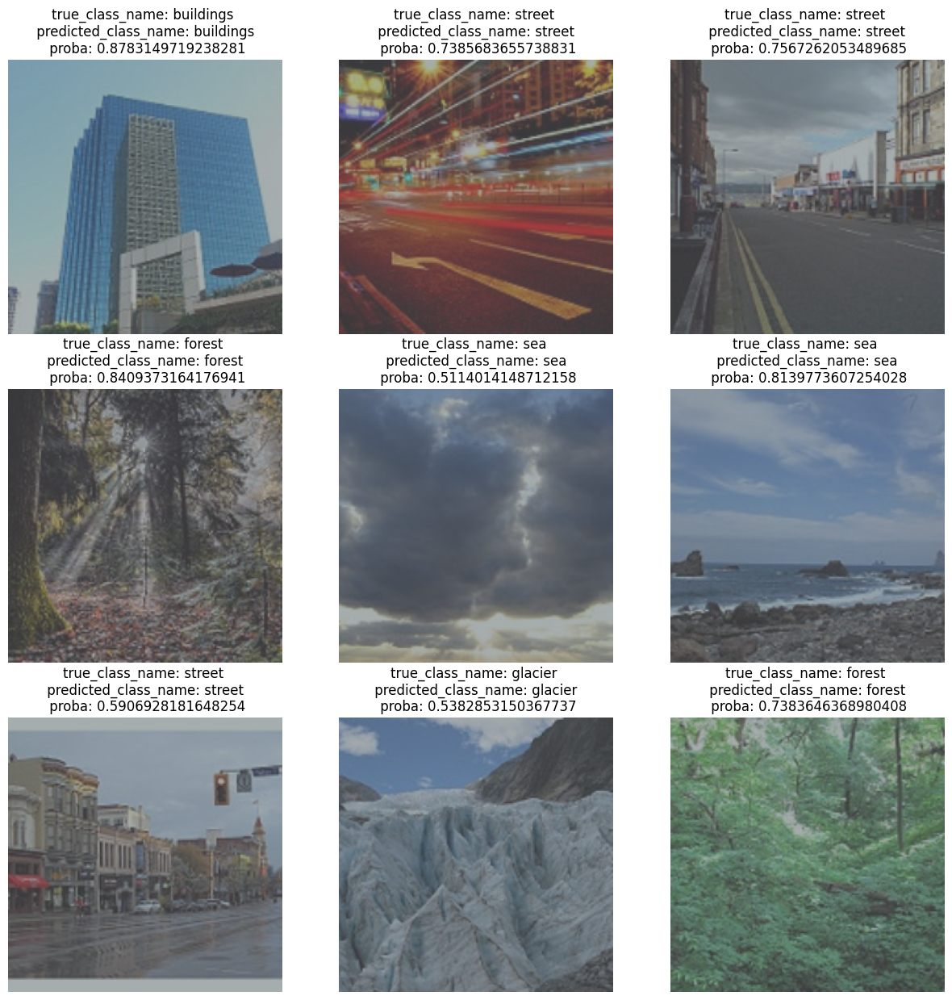

In [18]:
visualize_model_predictions(model, test_dataset, test_loader, experiment_name, device, idx_to_label, mean, std)

**Метрики модели resnet:** f1 мера 0.83

**Эксперимент 2 обучение модели VIT**

In [22]:
train_transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.RandomRotation(30), # Случайно поворачиваем изображение на +- 30 градусов во время обучения
        transforms.RandomGrayscale(p=0.1), # Случайно переводим изображение в оттенки серого с вероятностью 0.1 во время обучения
        transforms.ColorJitter( # Случайно изменяем цветовую палитру изображения во время обучения
          brightness=0.2,
          contrast=0.2,
          saturation=0.2,
          hue=0.1
        ),
        transforms.GaussianBlur(kernel_size=3), # Применяем гауссовские размытие к изображению
        transforms.ToTensor(), # Переводим изображение в torch.tensor
        transforms.Normalize( # Нормализуем изображение
          tuple(mean),
          tuple(std),
        ),
    ]
)

train_dataset = IntelImagesDataset(path_to_train_dataset, label_to_idx, train_transform)
model = models.vit_b_16(weights=models.ViT_B_16_Weights.IMAGENET1K_V1)
# Замораживаем все слои
for param in model.parameters():
    param.requires_grad = False

model.heads = nn.Linear(768, len(label_to_idx))

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())
batch_size = 4096
device = "cuda" if torch.cuda.is_available() else "cpu"
num_epochs = 10
experiment_name = "vib16 модель"
model = model.to(device)
model, train_losses = train_model(
    model=model,
    criterion=criterion,
    optimizer=optimizer, 
    num_epochs=num_epochs, 
    train_dataset=train_dataset, 
    batch_size=batch_size, 
    experiment_name=experiment_name, 
    device=device,
)

Epoch:  10%|█         | 1/10 [02:14<20:14, 134.91s/it]

Train loss: 1.6112


Epoch:  20%|██        | 2/10 [04:27<17:49, 133.68s/it]

Train loss: 1.1280


Epoch:  30%|███       | 3/10 [06:41<15:37, 133.92s/it]

Train loss: 0.8252


Epoch:  40%|████      | 4/10 [08:57<13:27, 134.56s/it]

Train loss: 0.6433


Epoch:  50%|█████     | 5/10 [11:10<11:09, 133.94s/it]

Train loss: 0.5345


Epoch:  60%|██████    | 6/10 [13:23<08:54, 133.53s/it]

Train loss: 0.4696


Epoch:  70%|███████   | 7/10 [15:35<06:39, 133.20s/it]

Train loss: 0.4290


Epoch:  80%|████████  | 8/10 [17:47<04:25, 132.80s/it]

Train loss: 0.3972


Epoch:  90%|█████████ | 9/10 [19:58<02:12, 132.34s/it]

Train loss: 0.3761


Epoch: 100%|██████████| 10/10 [22:11<00:00, 133.12s/it]

Train loss: 0.3527


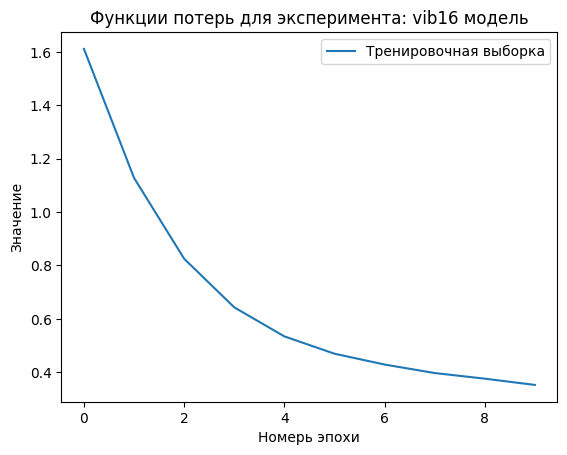

In [23]:
plt.plot(np.arange(len(train_losses)), train_losses, label="Тренировочная выборка")
plt.title(f"Функции потерь для эксперимента: {experiment_name}")
plt.xlabel("Номерь эпохи")
plt.ylabel("Значение")
plt.legend()
plt.show()

In [24]:
transform = transforms.Compose(
    [
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize( # Нормализуем изображение
              tuple(mean),
              tuple(std),
        ),
    ]
)
train_dataset = IntelImagesDataset(path_to_train_dataset, label_to_idx, transform)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
metrics = compute_metrics(model, test_loader, experiment_name, print_metrics=True)

Experiment name: vib16 модель
model_metrics: {'f1': 0.8649745217783479, 'recall': 0.8671116767248565, 'precision': 0.8763066433085328}


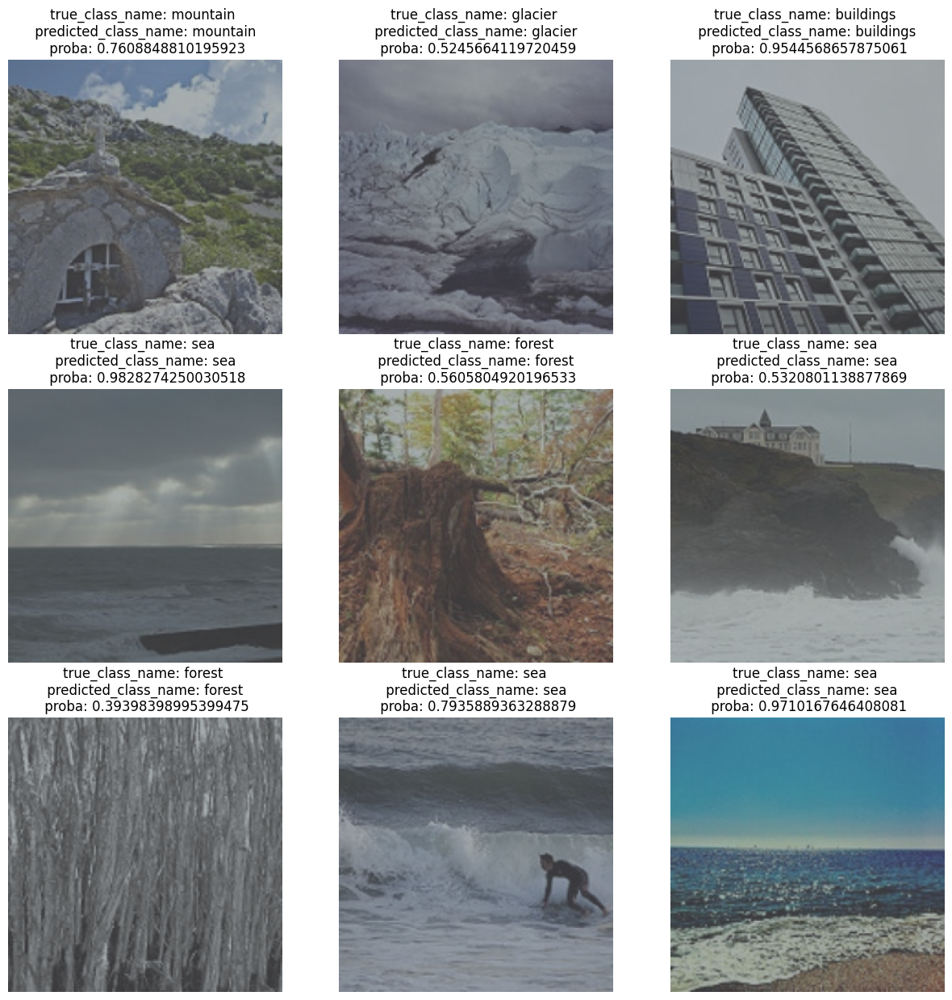

In [25]:
visualize_model_predictions(model, test_dataset, test_loader, experiment_name, device, idx_to_label, mean, std)

**Выводы:** VIT модель достигла лучшей метрике на представленном датасете 0.87 f1 мера против 0.83. Это подчеркивает, что трансформеры являются SOTA
архитектурой во многих задачах классификации изображений, но у трансфомерных моделей есть как свои преимущества так и недостатки.

Преимущества:

- Благодаря механизму self-attention трансформерные модели могут учитывать глобальный контекст изображения.
- Мультимодальность. Архитектура трансформер применяется во многих мультимодальных задачах

Недостатки:

- Медленная скорость работы по сравнению с обычными сверточными сетями
- Необходимость большого датасета для обучения. На маленьком датасете модель может обучиться хуже сверточной сети